In [1]:
!nvidia-smi

Sat Jul  4 01:27:41 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   36C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

 # Install the Ultralytics Package

In [2]:
!pip install ultralytics

# Import All the Requried Libraries

In [3]:
import ultralytics
ultralytics.checks()

Ultralytics 8.4.87 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 46.9/112.6 GB disk)


In [11]:
from ultralytics import YOLO
from IPython.display import Image

model = YOLO("yolo11n.pt")

In [5]:
!pip install roboflow

In [6]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="trta6GNa9BxIphg4DPfG")
project = rf.workspace("abdullahs-workspace-rcwes").project("football-players-detection-3zvbc-aa6iz")
version = project.version(1)
dataset = version.download("yolov11")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to football-players-detection-1 in yolov11:: 100%|██████████| 748/748 [00:00<00:00, 2426.25it/s]


In [7]:
dataset.location

'/content/football-players-detection-1'

# Train YOLO11 Model on a Custom Dataset

In [13]:
!yolo task = detect mode = train data = {dataset.location}/data.yaml model = '/content/yolo11n.pt' epochs = 30 imgsz = 640

Ultralytics 8.4.87 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/football-players-detection-1/data.yaml, degrees=0.0, deterministic=True, device=, dfl=1.5, dis=6.0, distill_model=None, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, over

# Examine Training Results

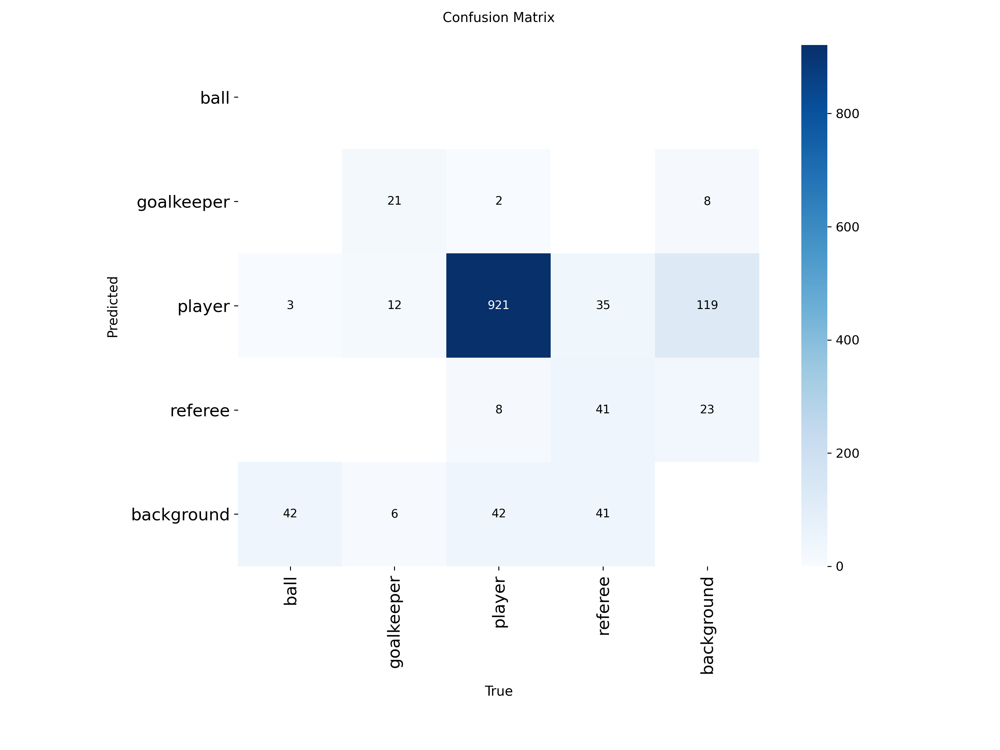

In [14]:
Image("/content/runs/detect/train/confusion_matrix.png", width=600)

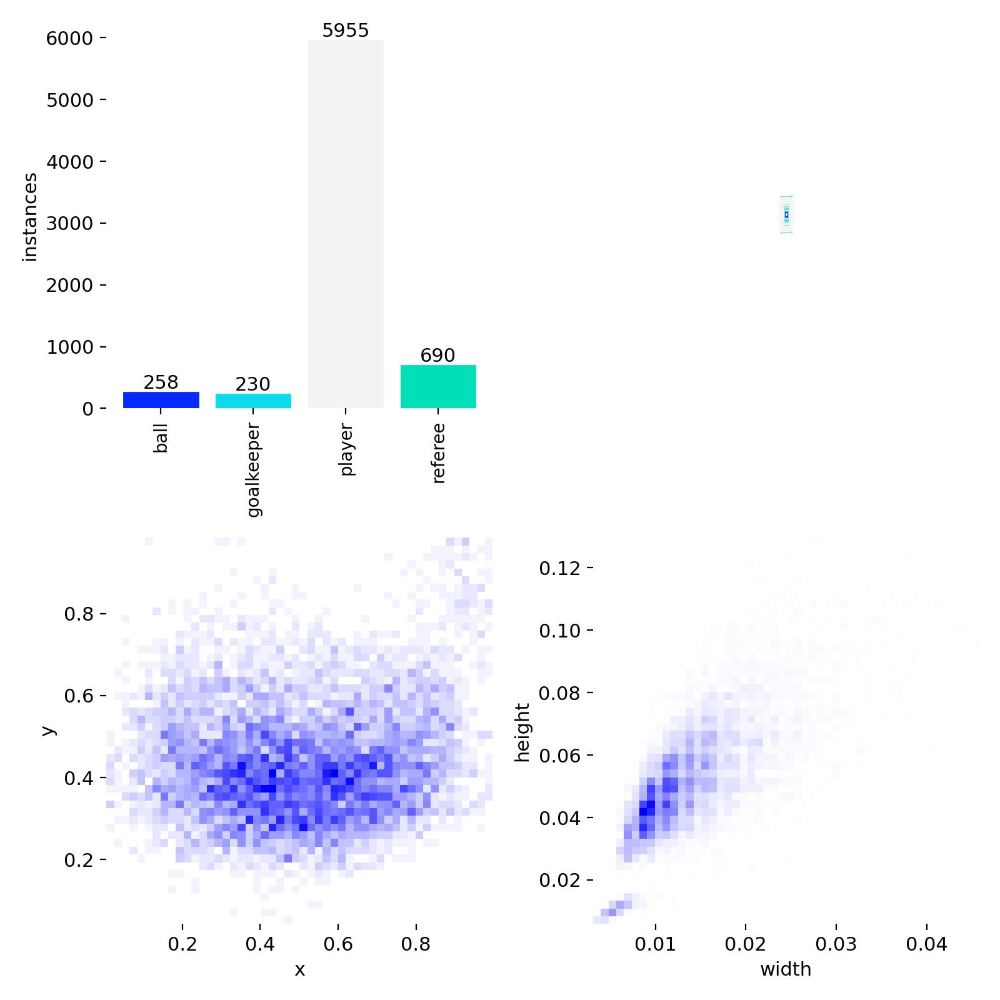

In [15]:
Image("/content/runs/detect/train/labels.jpg", width=600)

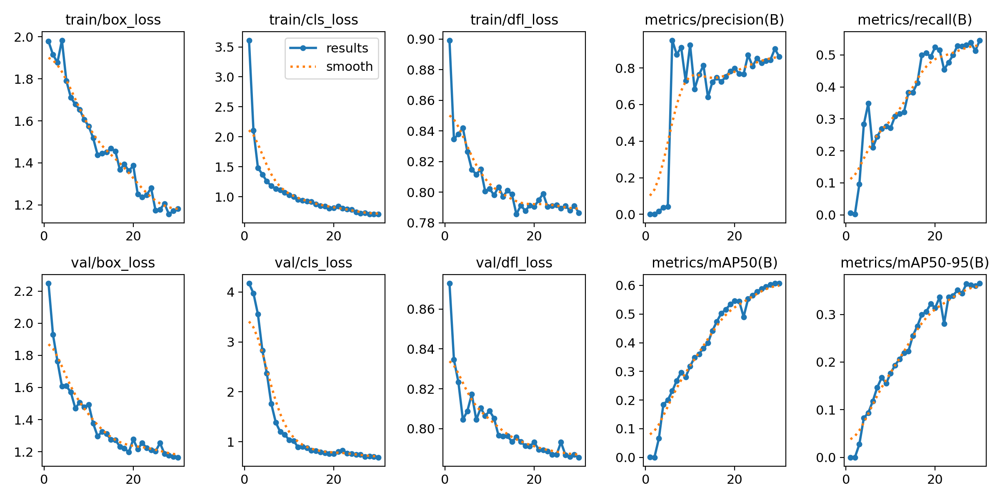

In [16]:
Image("/content/runs/detect/train/results.png", width=600)

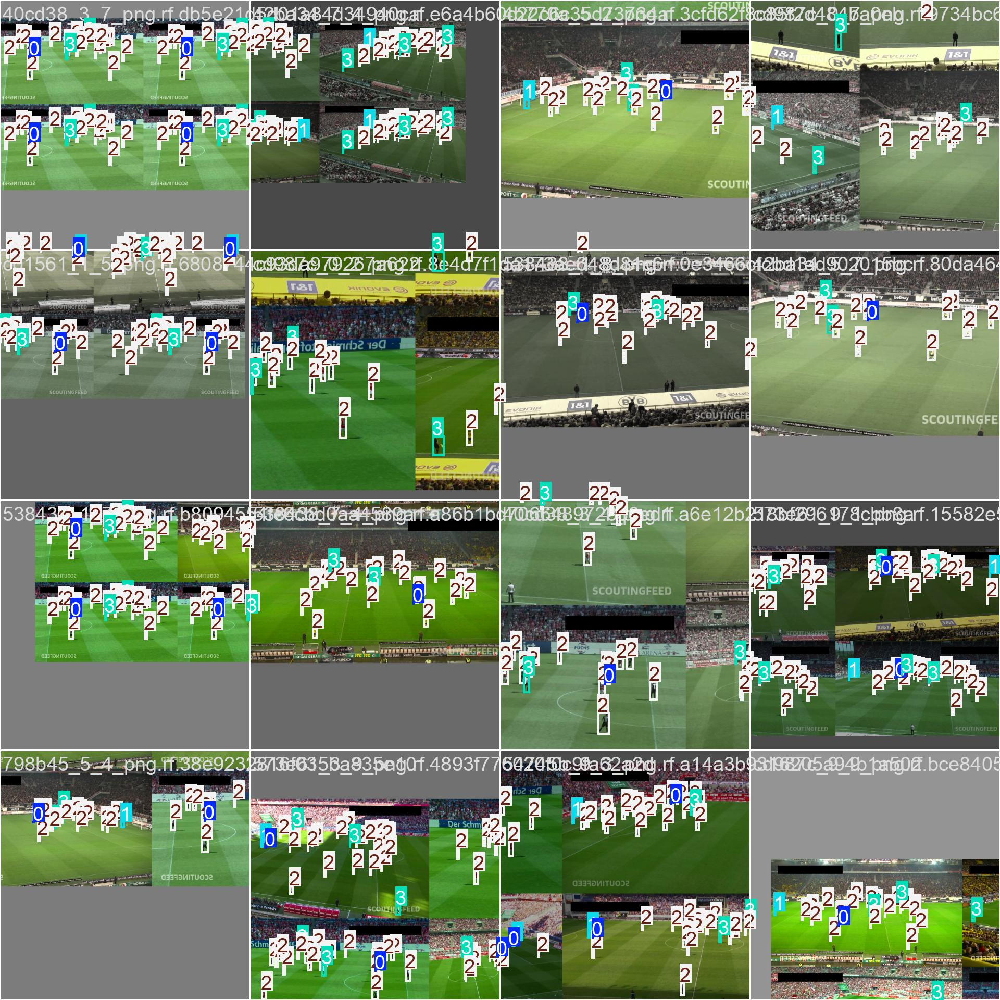

In [17]:
Image("/content/runs/detect/train/train_batch0.jpg", width=600)

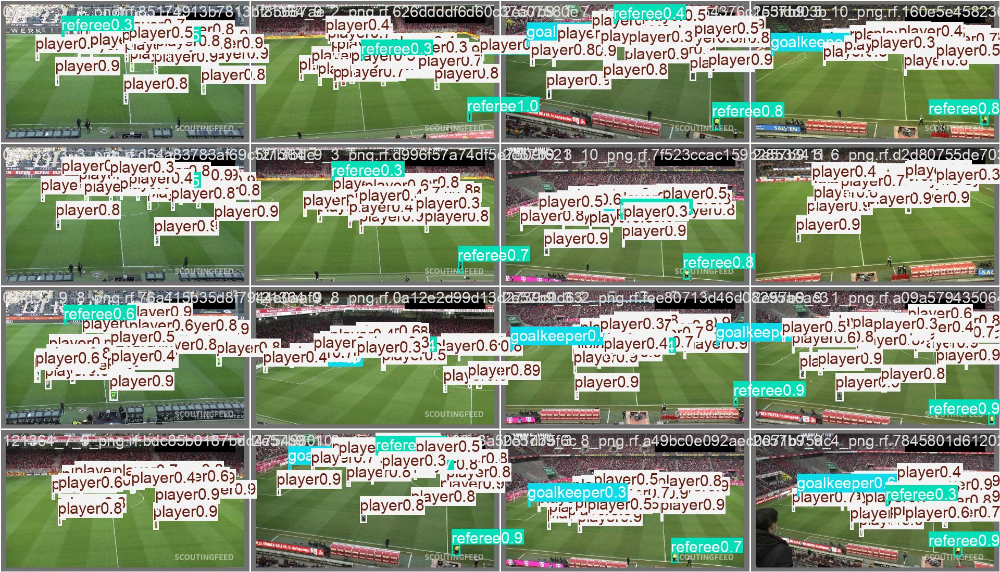

In [18]:
Image("/content/runs/detect/train/val_batch0_pred.jpg", width=600)

# Validate Fine-Tuned Model

In [19]:
!yolo task=detect mode=val model="/content/runs/detect/train/weights/best.pt" data={dataset.location}/data.yaml

Ultralytics 8.4.87 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11n summary (fused): 101 layers, 2,582,932 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2900.6±498.0 MB/s, size: 235.8 KB)
val: Scanning /content/football-players-detection-1/valid/labels.cache... 49 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 49/49 8.6Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.0s/it 4.2s
                   all         49       1174      0.862      0.546      0.607      0.371
                  ball         45         45          1          0     0.0162    0.00304
            goalkeeper         38         39      0.869      0.718      0.827       0.48
                player         49        973       0.84       0.96       0.96      0.645
               referee         49        117      0.738      0.505      0.625      0.356
Speed: 7.0ms preprocess, 24.4m

# Inference with Custom Model on Images

In [20]:
!yolo task=detect mode=predict model="/content/runs/detect/train/weights/best.pt" conf=0.25 source={dataset.location}/test/images save=True

Ultralytics 8.4.87 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11n summary (fused): 101 layers, 2,582,932 parameters, 0 gradients, 6.3 GFLOPs

image 1/25 /content/football-players-detection-1/test/images/08fd33_3_6_png.rf.d946b2cc14901c1175dd32af801330f3.jpg: 384x640 22 players, 2 referees, 82.6ms
image 2/25 /content/football-players-detection-1/test/images/08fd33_9_3_png.rf.f7eff4548ba02f6fce4e511e707aa279.jpg: 384x640 24 players, 11.4ms
image 3/25 /content/football-players-detection-1/test/images/40cd38_7_6_png.rf.cd850058bb13fa1e6a8552f2c749a3aa.jpg: 384x640 22 players, 11.1ms
image 4/25 /content/football-players-detection-1/test/images/42ba34_1_5_png.rf.73caa66cd84ecf290c34c8d587488d66.jpg: 384x640 1 goalkeeper, 22 players, 12.9ms
image 5/25 /content/football-players-detection-1/test/images/42ba34_5_5_png.rf.5505b78ab877a72cd1a8cae1457a765a.jpg: 384x640 23 players, 10.5ms
image 6/25 /content/football-players-detection-1/test/images/4b770a_1_4_png.rf.4664d418

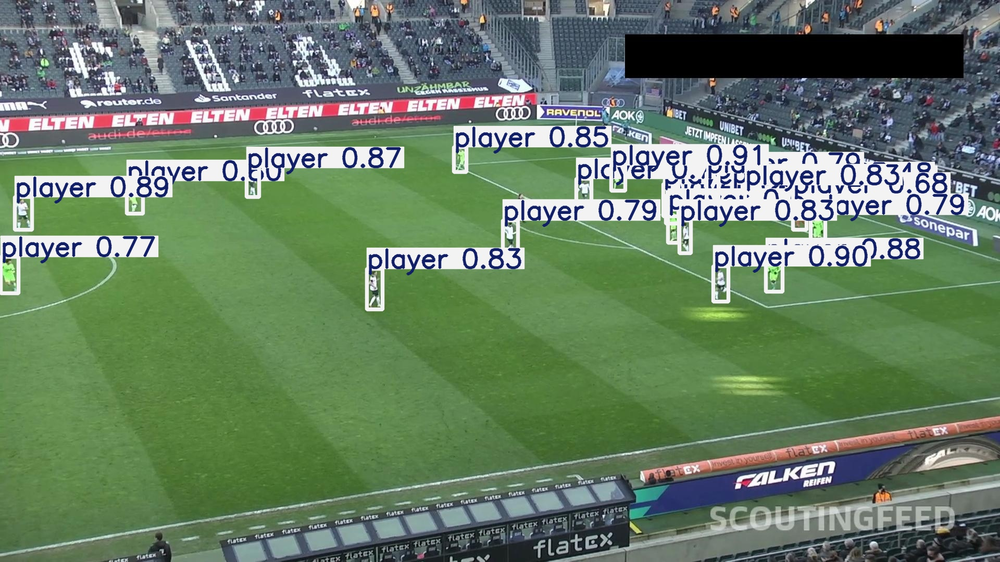

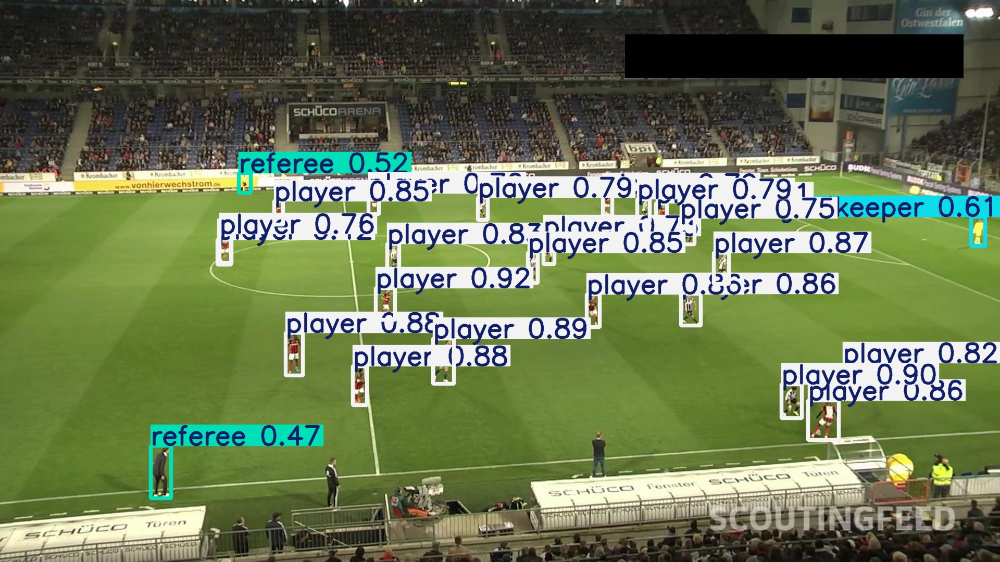

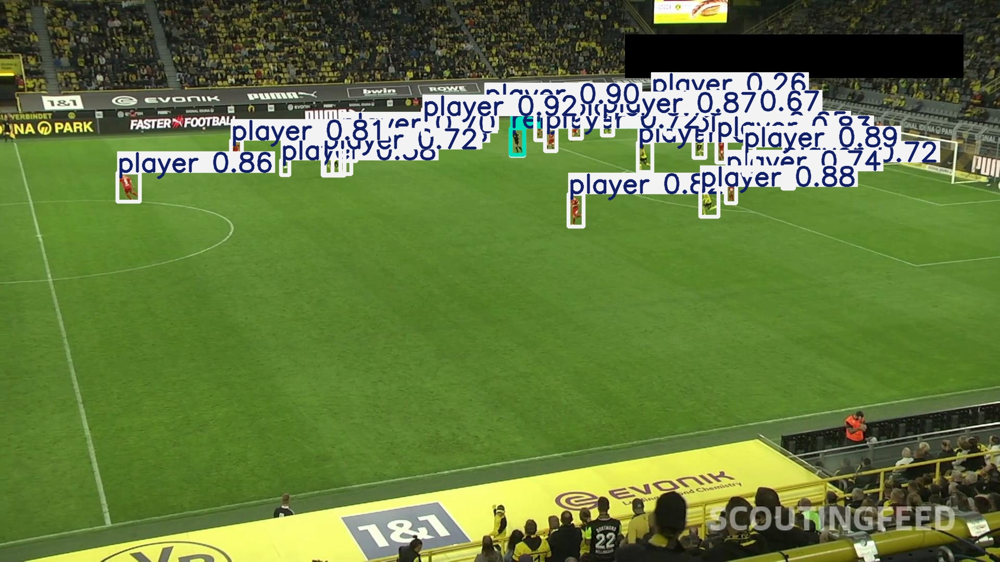

In [21]:
import glob
import os
from IPython.display import Image as IPyImage, display

latest_folder = max(glob.glob('/content/runs/detect/predict*/'), key=os.path.getmtime)
for img in glob.glob(f'{latest_folder}/*.jpg')[1:4]:
    display(IPyImage(filename=img, width=600))
    print("\n")

# Inference with Custom Model on Videos

In [22]:
!gdown "https://drive.google.com/file/d/1A6APCQkGvBfuBhYwsseWCInOd-gnbFRs/view?usp=sharing"

/usr/local/lib/python3.12/dist-packages/gdown/parse_url.py:48: UserWarning: You specified a Google Drive link that is not the correct link to download a file. You might want to try `--fuzzy` option or the following url: https://drive.google.com/uc?id=1A6APCQkGvBfuBhYwsseWCInOd-gnbFRs
  warnings.warn(
Downloading...
From: https://drive.google.com/file/d/1A6APCQkGvBfuBhYwsseWCInOd-gnbFRs/view?usp=sharing
To: /content/view?usp=sharing
73.7kB [00:00, 51.5MB/s]


In [24]:
!yolo task=detect mode=predict model= "/content/runs/detect/train/weights/best.pt" conf=0.25 source="/content/football.mp4" save=True

Ultralytics 8.4.87 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11n summary (fused): 101 layers, 2,582,932 parameters, 0 gradients, 6.3 GFLOPs

video 1/1 (frame 1/321) /content/football.mp4: 640x384 11 players, 52.3ms
video 1/1 (frame 2/321) /content/football.mp4: 640x384 9 players, 9.2ms
video 1/1 (frame 3/321) /content/football.mp4: 640x384 13 players, 8.4ms
video 1/1 (frame 4/321) /content/football.mp4: 640x384 14 players, 10.0ms
video 1/1 (frame 5/321) /content/football.mp4: 640x384 15 players, 2 referees, 8.8ms
video 1/1 (frame 6/321) /content/football.mp4: 640x384 13 players, 8.7ms
video 1/1 (frame 7/321) /content/football.mp4: 640x384 13 players, 8.8ms
video 1/1 (frame 8/321) /content/football.mp4: 640x384 12 players, 1 referee, 9.8ms
video 1/1 (frame 9/321) /content/football.mp4: 640x384 10 players, 1 referee, 8.8ms
video 1/1 (frame 10/321) /content/football.mp4: 640x384 13 players, 8.8ms
video 1/1 (frame 11/321) /content/football.mp4: 640x384 15 players,

In [25]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/runs/detect/predict-2/football.avi'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)